In [27]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import json
import contextily as ctx
import cartopy.crs as crs
import geopandas as gpd
import datetime as dt

cat = pd.read_csv('isc-gem-cat.csv', sep=',', header=53, na_values="",  parse_dates=[0] )
cat.columns = cat.columns.str.strip()

In [9]:
#import data from JustEat

#2018
months = [str(i).zfill(2) for i in range(9,13)]
df_justeat_2018 = pd.DataFrame()

for month in months:
    print(month, end='\r')
    url = "https://data.urbansharing.com/edinburghcyclehire.com/trips/v1/2018/"+month+".csv"
    df_tmp = pd.read_csv(url, parse_dates=['started_at'])
    df_justeat_2018 = df_justeat_2018.append(df_tmp)
df_justeat_2018['started_at','ended_at']= pd.to_datetime(df_justeat_2018['started_at'])

    
#2019
months = [str(i).zfill(2) for i in range(1,13)]
df_justeat_2019 = pd.DataFrame()

for month in months:
    print(month, end='\r')
    url = "https://data.urbansharing.com/edinburghcyclehire.com/trips/v1/2019/"+month+".csv"
    df_tmp = pd.read_csv(url, parse_dates=['started_at'])
    df_justeat_2019 = df_justeat_2019.append(df_tmp)
df_justeat_2019['started_at','ended_at']= pd.to_datetime(df_justeat_2019['started_at'])

#2020
months = [str(i).zfill(2) for i in range(1,11)]
df_justeat_2020 = pd.DataFrame()

for month in months:
    print(month, end='\r')
    url = "https://data.urbansharing.com/edinburghcyclehire.com/trips/v1/2020/"+month+".csv"
    df_tmp = pd.read_csv(url, parse_dates=['started_at'])
    df_justeat_2020 = df_justeat_2020.append(df_tmp)
df_justeat_2020['started_at','ended_at']= pd.to_datetime(df_justeat_2020['started_at'])

#Covid Time Period
Covid_Months = [str(i).zfill(2) for i in range(3,12)]
df_justeat_Covid = pd.DataFrame()

for Covid_Month in Covid_Months:
    print( Covid_Month, end='\r')
    url_2020 = "https://data.urbansharing.com/edinburghcyclehire.com/trips/v1/2020/"+Covid_Month+".csv"
    tmp = pd.read_csv(url_2020 , parse_dates=['started_at', 'ended_at'])
    df_justeat_Covid = df_justeat_Covid.append(tmp)
df_justeat_Covid['started_at','ended_at']= pd.to_datetime(df_justeat_Covid['started_at'])

In [10]:
#Data frame with all data
alldata = [df_justeat_2018, df_justeat_2019, df_justeat_2020]
df_justeat_total = pd.concat(alldata)

# General Trends

## 1. Number of Journeys per Day 

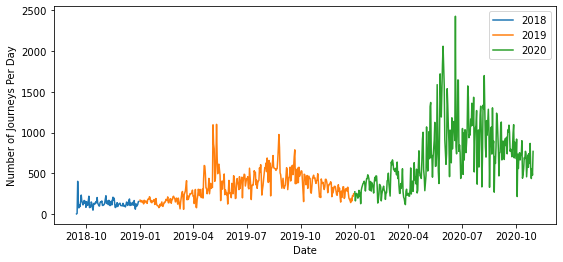

In [11]:
#figure 1 - number of trips per day
fig, ax = plt.subplots()

plot = df_justeat_2018.groupby(df_justeat_2018['started_at'].rename('Date').dt.date).size().plot(figsize=(9,4), label = 2018)
plot = df_justeat_2019.groupby(df_justeat_2019['started_at'].rename('Date').dt.date).size().plot(figsize=(9,4), label = 2019)
plot = df_justeat_2020.groupby(df_justeat_2020['started_at'].rename('Date').dt.date).size().plot(figsize=(9,4), label = 2020)
plot.set_ylabel("Number of Journeys Per Day")
plot.legend()

The graph above (figure 1) shows the number of daily journeys since the company began back in September 2018. Overall the graph shows a clear increase in daily number of journeys over the 26 months. It also shows clear peaks in summer months which is as expected due to the weather being warmer and there being longer hours of day light. There is also a significant peak between June 2020 and July 2020 which we will explore later, and its possible link to COVID-19. 

## 2. Average Number of Journeys per Day

In [12]:
df_justeat_2018['started_at'] = df_justeat_2018['started_at'].map(lambda x: x.date())
# Create a Group by object using tripdate
grp_date_2018 = df_justeat_2018.groupby('started_at')

# Compute number of trips by date and check out the result
trips_by_date_2018 = pd.DataFrame(grp_date_2018.size(), columns=['num_trips'])

print(trips_by_date_2018)

            num_trips
started_at           
2018-09-15          3
2018-09-16         10
2018-09-17        403
2018-09-18        126
2018-09-19         77
...               ...
2018-12-26         95
2018-12-27        108
2018-12-28        117
2018-12-29        153
2018-12-30        156

[105 rows x 1 columns]


In [13]:
#average number of trips per day in 2018
average_2018 = trips_by_date_2018['num_trips'].mean()
print(average_2018)

130.8


In [14]:
df_justeat_2019['started_at'] = df_justeat_2019['started_at'].map(lambda x: x.date())
# Create a Group by object using tripdate
grp_date_2019 = df_justeat_2019.groupby('started_at')

# Compute number of trips by date and check out the result
trips_by_date_2019 = pd.DataFrame(grp_date_2019.size(), columns=['num_trips'])


In [15]:
#average number of trips per day in 2019
average_2019 = trips_by_date_2019['num_trips'].mean()
print(average_2019)

341.15492957746477


In [16]:
df_justeat_2020['started_at'] = df_justeat_2020['started_at'].map(lambda x: x.date())
# Create a Group by object using tripdate
grp_date_2020 = df_justeat_2020.groupby('started_at')

# Compute number of trips by date and check out the result
trips_by_date_2020 = pd.DataFrame(grp_date_2020.size(), columns=['num_trips'])


In [17]:
#average number of trips per day in 2019
average_2020 = trips_by_date_2020['num_trips'].mean()
print(average_2020)

698.7864406779661


In [18]:
#percentage increases in average trip numbers per day between years
increase_2018_to_2019 = ((average_2019 - average_2018)/average_2018)*100
print(round(increase_2018_to_2019, 2), "%")
increase_2019_to_2020 = ((average_2020 - average_2019)/average_2019)*100
print(round(increase_2019_to_2020,2), "%")
increase_2018_to_2020 = ((average_2020 - average_2018)/average_2018)*100
print(round(increase_2018_to_2020, 2), "%")

160.82 %
104.83 %
434.24 %


Looking at the average number of trips per day in each of the 3 years we can see there has been a significant increase. In 2018 the average number of trips per day was 131, which then increased by 160.82% to an average of 341 in 2019. This number then increased by a further 104.83% to 2020 where the current average number of trips per day sits at 699. Overall there was a 434.24% between 2018 and 2020, showing the business is growing in popularity year on year. 

## 3. Duration of Journeys

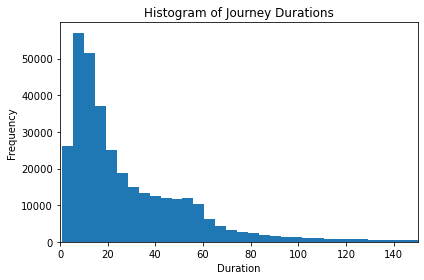

In [20]:
df_justeat_total['duration_in_mins'] = df_justeat_total['duration']/60

df_justeat_total['duration_in_mins'].plot.hist(bins =5000)
plt.title("Histogram of Journey Durations")
plt.xlabel('Duration')
plt.xlim([0,150])
plt.tight_layout()

In [21]:
print(df_justeat_total['duration_in_mins'].describe())

count    340986.000000
mean         34.354108
std         145.061465
min           1.016667
25%          10.333333
50%          19.116667
75%          41.866667
max       22884.050000
Name: duration_in_mins, dtype: float64


The data on journey durations shows that most people are using the bikes for journeys between 10 and 42 minutes, with the average journey being around 19 minutes. This data suggests that JustEat should be focussing on getting people to replace bus, car, or tram commutes with cycling. In 19 minutes the average commuter cyclist could travel between 3.5 miles and 5.7 miles (bikecommuterhero), which could get you all the way out to Sightgill industrial park (5.4 miles). This commute by tram would take around 16 minutes (google maps), which is very comparable. If JustEat can promote businesses to incentivise workers to cycle to work rather than drive or take public transport this could really benefit the business. We will look into commuter routes more specifically later. 

## 4. Electric Bikes

The introduction of electric bikes occured on 2nd March 2020, 160 were introduced at first with the cost being the same for the first 2 weeks of use. After March 16th they cost an additional 10p per minute than the regular bikes. Due to the data making no indication on whether or not the trip uses an e-bike, we are first going to compare the time taken to complete a trip before March 2nd, and after March 2nd.  The trip we are looking at is from Meadows East Station to Dundee Terrace, which is around 1.8 miles. We have chosen this trip in particular because it is a well used route both before and after the introduction of electric bikes. 

In [22]:
# make a bool column with True if March 2020 or later, or False if before March 2020 (before covid-19 rise)
df_justeat_total['after_ebikes'] = df_justeat_total.started_at.dt.date >= pd.to_datetime('2020-03-02')
# convert column from bool to string
df_justeat_total = df_justeat_total.replace({True: 'TRUE', False: 'FALSE'}) 


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

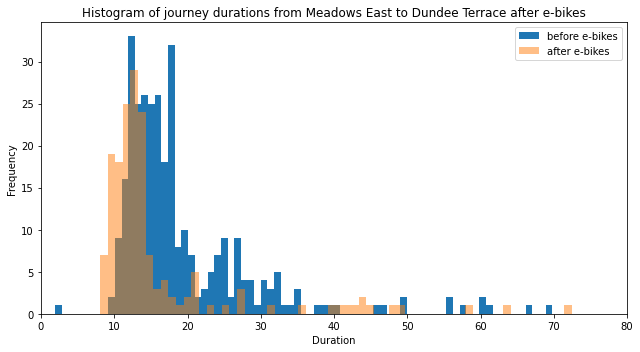

In [23]:
#select duration, start station, and end station
journey_time = df_justeat_total[['duration_in_mins', 'start_station_name', 'end_station_name', 'after_ebikes']]
#merge columns to find routes
journey_time['route'] = journey_time['start_station_name'] + journey_time['end_station_name'] + journey_time['after_ebikes']
#select only routes from Meadows East to Kings Buildings and creating histogram
mask = journey_time['route'] == 'Meadows EastDundee TerraceFALSE'

journey_time[mask]['duration_in_mins'].plot.hist(figsize = (9,5), bins=500, label = "before e-bikes")
plt.title("Histogram of journey durations from Meadows East to Dundee Terrace before e-bikes")
plt.xlabel('Duration')
plt.xlim([0,70])
plt.legend()
plt.tight_layout()

#select duration, start station, and end station
journey_time = df_justeat_total[['duration', 'start_station_name', 'end_station_name', 'after_ebikes']]
#convert duration in seconds to minutes
journey_time['duration_in_mins'] = journey_time['duration'].div(60)
#merge columns to find routes
journey_time['route'] = journey_time['start_station_name'] + journey_time['end_station_name'] + journey_time['after_ebikes']
#select only routes from Pollock Halls to Kings Buildings and creating histogram
mask = journey_time['route'] == 'Meadows EastDundee TerraceTRUE'

journey_time[mask]['duration_in_mins'].plot.hist(figsize = (9,5), bins=100, alpha = 0.5, label = "after e-bikes")
plt.title("Histogram of journey durations from Meadows East to Dundee Terrace after e-bikes")
plt.xlabel('Duration')
plt.xlim([0,80])
plt.legend()
plt.tight_layout()


Comparing the 2 histograms we can see that the mode for both lie between 10 and 20 minutes. However I think it is clear to see that after the introduction of e-bikes the journey time has become quicker, with a smaller proportion of journeys being over 20 minutes. 
For the business this may be a good piece of data to use to show how this route and other routes have become even quicker to use. It is also important to note that there are 3 direct buses between these 2 stations (2,3,33) but their journey time is about 20 minutes - which is very similar if not longer than cycling, as the route by bus isn't as direct. 

# Effects of Covid 19

## 1.

### The first thing I'm going to look into is how the usage has changed generally between 2019 and 2020

#### To see how Coronavirus has effected I chose some important dates and plotted them, then compared them to the same dates in 2019. The dates i've chosen are

- First positive case, 2020-03-01

- First fatality, 2020-01-13

- Lockdown, 2020-03-23

- First weekly reduction in deaths, 2020-05-06

- First restrictions eased, 2020-05-06

- Travel restrictions eased, 2020-07-10

- Schools return, 2020-08-11

- University of Edinburgh Returns, 2020-09-14

- Pubs closed again, 2020-10-09

In [24]:
#Converting Data to DateTime
df_justeat_2018['started_at','ended_at']= pd.to_datetime(df_justeat_2018['started_at'])
df_justeat_2019['started_at','ended_at']= pd.to_datetime(df_justeat_2019['started_at'])
df_justeat_2020['started_at','ended_at']= pd.to_datetime(df_justeat_2020['started_at'])
df_justeat_Covid['started_at','ended_at']= pd.to_datetime(df_justeat_Covid['started_at'])

In [25]:
#Dictionary of Key Dates

                #Covid Dates
covid_dates  = {'First positive case': pd.to_datetime('2020-03-01'),
              'First Fatality': pd.to_datetime('2020-03-13'),
              'Lockdown': pd.to_datetime('2020-03-23'),
              'First weekly reduction in deaths': pd.to_datetime('2020-05-06'),
              'First Restrictions Eased':pd.to_datetime('2020-05-29'),
              'Travel Restricion Lifted':pd.to_datetime('2020-07-10'),
              'Schools Return' : pd.to_datetime('2020-08-11'),
              'University of Edinburgh Returns': pd.to_datetime('2020-09-14'),
              'Pubs Close Again': pd.to_datetime('2020-10-09')}

                #Same Dates in 2019
date_2019  = {'First positive case': pd.to_datetime('2019-03-01'),
              'First Fatality': pd.to_datetime('2019-03-13'),
              'Lockdown': pd.to_datetime('2019-03-23'),
              'First weekly reduction in deaths': pd.to_datetime('2019-05-06'),
              'First Restrictions Eased':pd.to_datetime('2019-05-29'),
              'Travel Restricion Lifted':pd.to_datetime('2019-07-10'),
              'Schools Return' : pd.to_datetime('2019-08-11'),
              'University of Edinburgh Returns': pd.to_datetime('2019-09-14'),
              'Pubs Close Again': pd.to_datetime('2019-10-09')}

AttributeError: Can only use .dt accessor with datetimelike values

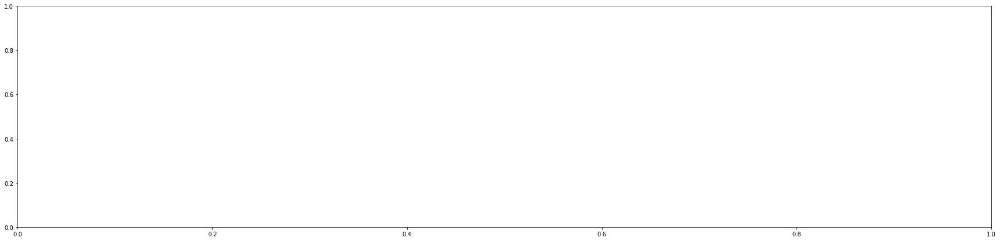

In [28]:
#Plotting the Number Rides And Key Coivd Dates Graph
fig, ax1 = plt.subplots(1,1, figsize = (30,7))
Year_Plot_2020 = df_justeat_2020.groupby(df_justeat_2020['started_at'].rename('Date').dt.date).size().plot(kind="line", legend = False, ax = ax1, label = 'Number of Rides per week')

# Plotting the Key Coivd Dates as x lines 
xcoords = list(covid_dates.values())
labels = list(covid_dates.keys())
colors = ['red','yellow','green','lime','crimson', 'black', 'blue', 'Indigo', 'Magenta', 'cyan']
for xc,lab,c in zip(xcoords,labels, colors):
    plt.axvline(x=xc, label=lab.format(xc), color=c, linestyle='--')
    plt.text(xc,3000,lab,rotation=90, fontsize = 20)

#Setting the Features of the Graph
plt.title("Trips Per Day, 2020", fontsize=30)
plt.xticks(xcoords, labels = ['March 1','March 13','March 23','May 6','May 29', 'July 10', 'August 11','September 14', 'October 10'], fontsize=16, rotation = 90)
plt.xlabel('Date', fontsize=20)
plt.ylabel('Number of Rides', fontsize=20)

fig, ax2=plt.subplots(1,1, figsize = (30,7))
Year_Plot_2019 = df_justeat_2019.groupby(df_justeat_2019['started_at'].rename('Date').dt.date).size().plot(kind="line", legend = False, ax = ax2, label = 'Number of Rides per week' , color ='r')

# Plotting the Key Coivd Dates as x lines 
xcoords = list(date_2019.values())
labels = list(date_2019.keys())
colors = ['red','yellow','green','lime','crimson', 'black', 'blue', 'Indigo', 'Magenta', 'cyan']
for xc,lab,c in zip(xcoords,labels, colors):
    plt.axvline(x=xc, label=lab.format(xc), color=c, linestyle='--')

#Setting the Features of the Graph
plt.title("Trips Per Day, 2019", fontsize=30)
plt.xticks(xcoords, labels = ['March 1','March 13','March 23','May 6','May 29', 'July 10', 'August 11','September 14', 'October 10'], fontsize=16, rotation = 90)
plt.xlabel('Date', fontsize=20)
plt.ylabel('Number of Rides', fontsize=20)

plt.tight_layout()

## Comparing the Two Daily Usage Graphs
Comparing the data displayed in the two graphs above, we can analysis how the general usage of Just Eat bikes has been effected by the Covid-19 pandemic. The fisrt observation we can make is that more bikes were used per day throughout the whole year, there isn't a large enough backlong of data to make a statement as to if the increase is in keeping with what would be predicted;

- The first two months of both years have very similar gradients and are much lower than the rest of the year, this is   likely due inclemant weather and not great cycling conditions.

- In 2020, once the lockdown was announced the ammount of people using Just Eat bikes drastically dropped to the rates at the start of the year.

- Inbetween Mid March and End of April the gradient of the graph is similar in both, a steady constant increase.

- The biggest difference between the two years is the period between May and August. In 2020 the ammount of people using Just Eat bikes remained high compared to in 2019 the ammount of people using Just Eat bikes dropped. 

- In both graphs the ammount of people using the bikes slowly drops off for the rest of the year.

In [29]:
#Creating Data for Pre Covid Start Stations
start_station_summary_2019=df_justeat_2019[['start_station_name','start_station_longitude','start_station_latitude']]
start_station_summary_2019 = start_station_summary_2019.drop_duplicates()
start_trips_starting_pre_covid = df_justeat_2019.groupby('start_station_name')['start_station_name'].count()
start_trips_starting_pre_covid = pd.DataFrame(start_trips_starting_pre_covid)
start_trips_starting_pre_covid.columns = ['start_trips_starting_pre_covid']
start_station_summary_2019 = pd.merge(start_station_summary_2019, start_trips_starting_pre_covid, on='start_station_name')

#Creating Data for Pre Covid End Stations
end_station_summary_2019=df_justeat_2019[['end_station_name','end_station_longitude','end_station_latitude']]
end_station_summary_2019 = end_station_summary_2019.drop_duplicates()
end_trips_starting_pre_covid = df_justeat_2019.groupby('end_station_name')['end_station_name'].count()
end_trips_starting_pre_covid = pd.DataFrame(end_trips_starting_pre_covid)
end_trips_starting_pre_covid.columns = ['end_trips_starting_pre_covid']
end_station_summary_2019 = pd.merge(end_station_summary_2019, end_trips_starting_pre_covid, on='end_station_name')

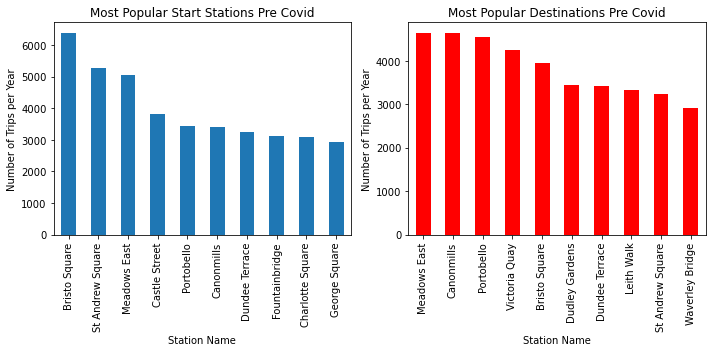

In [30]:
#Bar Chart for top 10 Start Stations Pre Covid
start_Top_Pre_Covid=start_trips_starting_pre_covid.nlargest(10,'start_trips_starting_pre_covid')
end_Top_Pre_Covid=end_trips_starting_pre_covid.nlargest(10,'end_trips_starting_pre_covid')

fig, ax = plt.subplots(1,2, figsize=(10,5))

start_Top_Pre_Covid.plot(ax = ax[0], kind='bar', legend = None)
end_Top_Pre_Covid.plot(ax = ax[1], kind='bar', legend = None, color = 'r')


ax[0].set_title("Most Popular Start Stations Pre Covid")
ax[0].set_xlabel("Station Name")
ax[0].set_ylabel("Number of Trips per Year")


ax[1].set_title("Most Popular Destinations Pre Covid")
ax[1].set_xlabel("Station Name")
ax[1].set_ylabel("Number of Trips per Year")

plt.tight_layout()


In [ ]:
start_Top_Pre_Covid_Summary=start_station_summary_2019.nlargest(10,'start_trips_starting_pre_covid')
start_Top_Pre_Covid_Summary_gdf = gpd.GeoDataFrame(start_Top_Pre_Covid_Summary, geometry=gpd.points_from_xy(start_Top_Pre_Covid_Summary["start_station_longitude"],start_Top_Pre_Covid_Summary["start_station_latitude"]))
end_Top_Pre_Covid_Summary=end_station_summary_2019.nlargest(10,'end_trips_starting_pre_covid')
end_Top_Pre_Covid_Summary_gdf = gpd.GeoDataFrame(end_Top_Pre_Covid_Summary, geometry=gpd.points_from_xy(end_Top_Pre_Covid_Summary["end_station_longitude"],end_Top_Pre_Covid_Summary["end_station_latitude"]))

In [ ]:
start_Top_Pre_Covid_Summary_gdf.crs={'init':'epsg:4326'}
f,ax1 = plt.subplots(1, figsize=(250,150))
ax1=start_Top_Pre_Covid_Summary_gdf.plot(ax=ax1, alpha=1, markersize=start_Top_Pre_Covid_Summary_gdf["start_trips_starting_pre_covid"], color='b')
ax1.set_axis_off()
ctx.add_basemap(ax1,crs=start_Top_Pre_Covid_Summary_gdf.crs)
plt.show()

end_Top_Pre_Covid_Summary_gdf.crs={'init':'epsg:4326'}
f,ax2 = plt.subplots(1, figsize=(200,150))
ax2=end_Top_Pre_Covid_Summary_gdf.plot(ax=ax2, alpha=1, markersize=end_Top_Pre_Covid_Summary_gdf["end_trips_starting_pre_covid"], color='r')
ax2.set_axis_off()
ctx.add_basemap(ax2,crs=end_Top_Pre_Covid_Summary_gdf.crs)
plt.show()

## Analizing the most popular Start and End stations Pre Covid 
### Start Stations
Pre covid the 2 most poplular start stations were Bristo Square and St Andrews Square, both are in the heart of the University of Edinburgh Campus. These are popular as may students don't own bikes and use the bikes to travel from the station. Other popular start stations were located near to tourist destinations, such as; Cannonmills, Portobello, Dundee Terrace and Meadows East. The final few popular stations were located near to commercial areas such as; Charlotte Square, St Andrews square and Castle Street. 
### End Stations
The only changes between the start and end destinations are the stations; Leith Walk and Dudly gardens. Leith walk is at the bottom of a large hill, inturn customers will cycle down the hill but are more likely to use other forms of transport to get back up the hill. 

In [ ]:
#Creating Data for Covid Start Stations
start_station_summary=df_justeat_Covid[['start_station_name','start_station_longitude','start_station_latitude']]
start_station_summary = start_station_summary.drop_duplicates()
start_trips_starting_post_covid = df_justeat_Covid.groupby('start_station_name')['start_station_name'].count()
start_trips_starting_post_covid = pd.DataFrame(start_trips_starting_post_covid)
start_trips_starting_post_covid.columns = ['start_trips_starting_post_covid']
start_station_summary = pd.merge(start_station_summary, start_trips_starting_post_covid, on='start_station_name')
print
#Creating Data for Covid End Stations
end_station_summary=df_justeat_Covid[['end_station_name','end_station_longitude','end_station_latitude']]
end_station_summary = end_station_summary.drop_duplicates()
end_trips_starting_post_covid = df_justeat_Covid.groupby('end_station_name')['end_station_name'].count()
end_trips_starting_post_covid = pd.DataFrame(end_trips_starting_post_covid)
end_trips_starting_post_covid.columns = ['end_trips_starting_post_covid']
end_station_summary = pd.merge(end_station_summary, end_trips_starting_post_covid, on='end_station_name')

In [ ]:
start_Top_Post_Covid=start_trips_starting_post_covid.nlargest(10,'start_trips_starting_post_covid')
end_Top_Post_Covid=end_trips_starting_post_covid.nlargest(10,'end_trips_starting_post_covid')

fig, ax = plt.subplots(1,2, figsize=(10,5))

start_Top_Post_Covid.plot(ax = ax[0], kind='bar', legend = None)
end_Top_Post_Covid.plot(ax = ax[1], kind='bar', legend = None, color = 'r')


ax[0].set_title("Most Popular Start Stations Post Covid")
ax[0].set_xlabel("Station Name")
ax[0].set_ylabel("Number of Trips per Year")


ax[1].set_title("Most Popular Destinations Post Covid")
ax[1].set_xlabel("Station Name")
ax[1].set_ylabel("Number of Trips per Year")

plt.tight_layout()


In [ ]:
start_Top_Post_Covid_Summary=start_station_summary.nlargest(10,'start_trips_starting_post_covid')
start_Top_Post_Covid_Summary_gdf = gpd.GeoDataFrame(start_Top_Post_Covid_Summary, geometry=gpd.points_from_xy(start_Top_Post_Covid_Summary["start_station_longitude"],start_Top_Post_Covid_Summary["start_station_latitude"]))

end_Top_Post_Covid_Summary=end_station_summary.nlargest(10,'end_trips_starting_post_covid')
end_Top_Post_Covid_Summary_gdf = gpd.GeoDataFrame(end_Top_Post_Covid_Summary, geometry=gpd.points_from_xy(end_Top_Post_Covid_Summary["end_station_longitude"],end_Top_Post_Covid_Summary["end_station_latitude"]))

In [ ]:
start_Top_Post_Covid_Summary_gdf.crs={'init':'epsg:4326'}
f,ax1 = plt.subplots(1, figsize=(250,100))
ax1 = start_Top_Post_Covid_Summary_gdf.plot( ax = ax1, alpha = 1, markersize=start_Top_Post_Covid_Summary_gdf["start_trips_starting_post_covid"], color = 'b' )
ax1.set_axis_off()
ctx.add_basemap(ax1, crs= start_Top_Post_Covid_Summary_gdf.crs)
plt.show()

end_Top_Post_Covid_Summary_gdf.crs={'init':'epsg:4326'}
f,ax2 = plt.subplots(1, figsize=(250,100))
ax2 = end_Top_Post_Covid_Summary_gdf.plot( ax = ax2, alpha = 1, markersize=end_Top_Post_Covid_Summary_gdf["end_trips_starting_post_covid"], color = 'r' )
ax2.set_axis_off()
ctx.add_basemap(ax2, crs= end_Top_Post_Covid_Summary_gdf.crs)
plt.show()

## Analizing the most popular Start and End stations Post Covid 
### Changes due to Covid
In general there has been a large shift in the most popular stations, shifting away from the cit centre and large shopping districts to areas on the outskirts of the city or areas in large green spaces. This is due to the Covid restrictions meaning commuters are no longer traveling into the city and people are looking for day trips out of the city.
- The University Stations don't feature in the top 10 anymore, this is due to the decrease in student having to travel to and from the campus. 
- The Meadows stations have remaind popular to their location next to a large green space that is used for sport and socialising 
- A new Stop to feature is Cramond Foreshore, this stop is located on the sea front and the outskirts of the city. This fit right into the new consumer bases of scenic spots on the outskirts of the city

## Suggested Improvements

- There are very few stations around the South East of Arthurs Seat, therefore I would recommend you add a stop in Duddingston Village. This stop would be located at the base of Arthurs seat which is a large open area that people are likely to travel to get exercise and escape the confines of their own home.

- Due to the popularity of the University Stations in the past I would recommend adding a station at Peffermill. The people who use peffermill are sporty people who are likely to use bikes to get to and from peffermill. Even though students aren't using the main University Site as much, a large quantity of students are still playing sports at Peffermill. 

- I would add a station at Braid Hill as this is a large outdoor area with lots of walk trails, there currently isnt a station near here so expanding would increase the company's catchment 

# COMMUTER REPORT

### This section of the report will be looking at residential areas of Edinburgh and typical commuting locations in an attempt to profile commuters

This will be done by looking at bike stations in locations where we would expect commuters to travel to or from. These places include major train stations as well as large residential areas. The data from bike stations in these areas should help us profile commuters.

# 1. Train Stations

#### If there is anywhere in Edinburgh that will starkly show the habits of the typical commuter, it is the 2 major train stations, Waverly and Haymarket.

In [33]:
# making the new weekday column to see which journeys happened on which day of the week, and hour
df_justeat_total['weekday'] = df_justeat_total['started_at'].dt.dayofweek
df_justeat_total['hour'] = df_justeat_total['started_at'].dt.hour

In [35]:
# # looking at journeys from bike stations near the train stations
# extracting relevant rows
waverley_st = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Waverley Station']
waverley_br = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Waverley Bridge']
#making the waverly df
waverley = pd.concat([waverley_st, waverley_br], axis=0)

haymarket_st = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Haymarket Station']
haymarket_trr = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Haymarket Terrace']
#making the haymarket df
haymarket = pd.concat([haymarket_st, haymarket_trr], axis=0)

# making a data frame with data from the train stations
train_stations = pd.concat([waverley, haymarket], axis=0)

In [36]:
# extracting train station data for each day of the week
ts_mon = train_stations.loc[train_stations["weekday"] == 0]          # these are dataframes
ts_tues = train_stations.loc[train_stations["weekday"] == 1]
ts_wed = train_stations.loc[train_stations["weekday"] == 2]
ts_thurs = train_stations.loc[train_stations["weekday"] == 3]
ts_fri = train_stations.loc[train_stations["weekday"] == 4]
ts_sat = train_stations.loc[train_stations["weekday"] == 5]
ts_sun = train_stations.loc[train_stations["weekday"] == 6]

# train station weekday dataframe
ts_weekdays = pd.concat([ts_mon,ts_tues,ts_wed,
                                     ts_thurs,ts_fri],axis =0)

# train station weekend dataframe
ts_weekends = pd.concat([ts_sat, ts_sun], axis = 0)

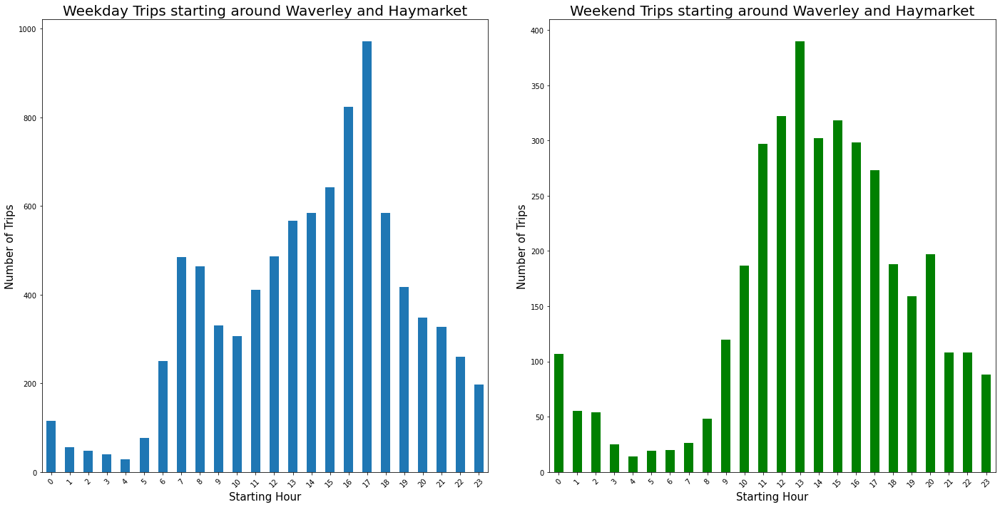

In [37]:
# grouping the 2 dataframes by hour and counting the events in each hour
ts_weekdays_hourly = ts_weekdays.groupby(ts_weekdays["started_at"].dt.hour)["started_at"].count()
ts_weekend_hourly = ts_weekends.groupby(ts_weekends["started_at"].dt.hour)["started_at"].count()


fig, ax = plt.subplots(1,2, figsize=(20,10))

ts_weekdays_hourly.plot(ax = ax[0], kind='bar', legend = None)
ts_weekend_hourly.plot(ax = ax[1], kind='bar', legend = None, color = 'g')


ax[0].set_title("Weekday Trips starting around Waverley and Haymarket", size = 20)
ax[0].set_xlabel("Starting Hour", size = 15)
ax[0].set_ylabel("Number of Trips", size = 15)
ax[0].tick_params('x', labelrotation=45)


ax[1].set_title("Weekend Trips starting around Waverley and Haymarket", size = 20)
ax[1].set_xlabel("Starting Hour", size = 15)
ax[1].set_ylabel("Number of Trips", size = 15)
ax[1].tick_params('x', labelrotation=45)


plt.tight_layout()


#### The above graphs show how the frequency of bike trips during the working week compares with those at the weekend, from the bike stations that are situated near the 2 major train stations in Edinburgh - Waverly and Haymarket. 

##### We can see clearly that the bike trips starting from near the train stations at the weekend have a different pattern to those during the week. 

#### During the week
- There are 2 clear peak times - 7am and 5pm. These are the times we would expect commuting to be at its highest. This then indicates that commuters in Edinburgh do indeed use the Just Eat bikes as a means of their commute, either going from or to the train stations in Edinburgh.

#### At the weekend
- There is only 1 clear peak time which is at 1pm. This therefore indicates that the typical commuter we are profiling here does not use the bikes at the weekend. Because of this, we will only look at bike trip data from weekdays from now on. This peak is likely to be due to tourists being present in Edinburgh at the weekend, using the bikes for leisure.

It is worth noting that there are significantly more trips during the week compared to at the weekend. The biggest peak during the week sees nearly 1000 trips, while the peak at the weekend only sees nearly 400.

# 2 Residential Areas

#### As well as people who have arrived in the city via train, we can assume that the residents of the city will also have a use for the bikes during commuting times. We will extract data from specific residential regions and analyse the commuters' bike usage habits.

In [39]:
# extracting rows containing info about the specific residential region in the city's southside 
thirlestane_rd = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Thirlestane Road']
warrender_pk_rd = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Warrender Park Road']
marchmont_cresc = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Marchmont Crescent']
causewayside = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Causewayside']
meadows_east = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Meadows East']
gladstone_trr = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Gladstone Terrace']


# putting together the df with the relevant southern residential info
south_res = pd.concat([thirlestane_rd, warrender_pk_rd, marchmont_cresc, 
                       causewayside, meadows_east, gladstone_trr], axis=0)


# extracting southern residential data for each day of the working week
south_res_mon = south_res.loc[south_res["weekday"] == 0]          
south_res_tues = south_res.loc[south_res["weekday"] == 1]
south_res_wed = south_res.loc[south_res["weekday"] == 2]
south_res_thurs = south_res.loc[south_res["weekday"] == 3]
south_res_fri = south_res.loc[south_res["weekday"] == 4]


# putting together weekday dataframe for these specific locations
south_res_weekdays = pd.concat([south_res_mon, south_res_tues,south_res_wed,
                                     south_res_thurs, south_res_fri],axis =0)



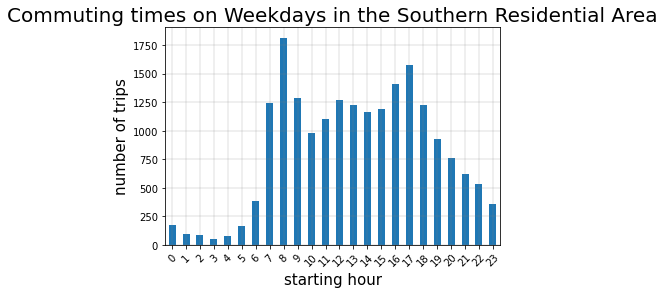

In [40]:
# grouping the weekday data for a selected residential area in Edinburgh
south_res_hourly = south_res_weekdays.groupby(south_res_weekdays["started_at"].dt.hour)["started_at"].count()

# plotting the freuqency of trips against the time of day
south_res_peak_plot = south_res_hourly.plot(kind="bar", legend = False)
plt.xlabel("starting hour", size = 15)
plt.xticks(rotation = 45)
plt.ylabel("number of trips", size = 15)
plt.title("Commuting times on Weekdays in the Southern Residential Area", size= 20)
plt.grid(color='grey', linestyle='-', linewidth=0.25)
plt.rcParams['figure.figsize'] = [10, 8]


#### The above graph shows the how travel time from bike stations in the southern residential area in the city centre varies throughout the day. 

There are, again, 2 clear peak times: one at 8am and one at 5pm. We can now be sure that the residents of Edinburgh use the bikes to commute, so we will now look at all of the bike stations located in Edinburgh's residential areas.

In [41]:
logie_gr_rd = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Logie Green Road']
east_ldn_st = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'East London Street']
dundee_trr = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Dundee Terrace']
canonmills = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Canonmills']
scotland_st = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Scotland Street']
colinton_rd = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Colinton Road']
morningside_rd = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Morningside Road']
hillside_cresc = df_justeat_total.loc[df_justeat_total["start_station_name"] == 'Hillside Crescent']

total_residential = pd.concat([south_res_weekdays, logie_gr_rd, east_ldn_st, dundee_trr, 
                               canonmills, scotland_st, colinton_rd, morningside_rd, hillside_cresc], axis = 0)


# extracting train station data for each day of the week
total_residential_mon = total_residential.loc[total_residential["weekday"] == 0]          # these are dataframes
total_residential_tues = total_residential.loc[total_residential["weekday"] == 1]
total_residential_wed = total_residential.loc[total_residential["weekday"] == 2]
total_residential_thurs = total_residential.loc[total_residential["weekday"] == 3]
total_residential_fri = total_residential.loc[total_residential["weekday"] == 4]

total_res_weekdays = pd.concat([total_residential_mon, total_residential_tues, 
                                total_residential_wed, total_residential_thurs, total_residential_fri])


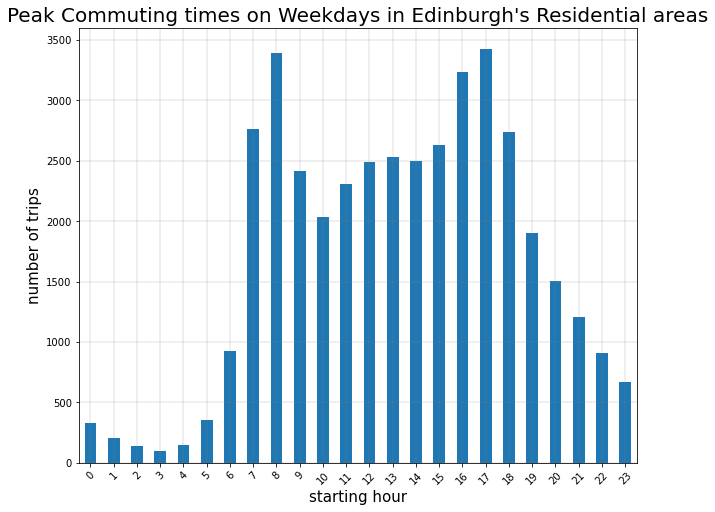

In [42]:
# grouping the residential weekday data by hour
total_res_hourly = total_res_weekdays.groupby(total_res_weekdays["started_at"].dt.hour)["started_at"].count()

# plotting the frequency of trips against the time of day
total_res_peak_plot = total_res_hourly.plot(kind="bar",legend = False)

plt.xlabel("starting hour", size = 15)
plt.xticks(rotation = 45)
plt.ylabel("number of trips", size = 15)
plt.title("Peak Commuting times on Weekdays in Edinburgh's Residential areas", size = 20)
plt.grid(color='grey', linestyle='-', linewidth=0.25)
plt.rcParams['figure.figsize'] = [10, 8]


#### This graph confirms that there are indeed peak times of bike usage starting in residential areas in Edinburgh.

We can certainly see that the residents of Edinburgh commute using the bikes, given that the peak times at 8am and 5pm are when we would expect the typical commuter to be travelling throughout the city. 

Now we will extract the bike trip data that exists solely during these peak time windows of 7-9am and 4-6pm to see where the Edinburgh residents are commuting to.

In [43]:
# creating a dataframe with only the peak time data
# extracting the relevant hours
peak_morning1 = total_res_weekdays.loc[total_res_weekdays["hour"]==7]
peak_morning2 = total_res_weekdays.loc[total_res_weekdays["hour"]==8]
peak_morning3 = total_res_weekdays.loc[total_res_weekdays["hour"]==9]

peak_afternoon1 = total_res_weekdays.loc[total_res_weekdays["hour"]==16]
peak_afternoon2 = total_res_weekdays.loc[total_res_weekdays["hour"]==17]
peak_afternoon3 = total_res_weekdays.loc[total_res_weekdays["hour"]==18]

peak_res_time = pd.concat([peak_morning1, peak_morning2, peak_morning3, peak_afternoon1, 
                           peak_afternoon2, peak_afternoon3 ])


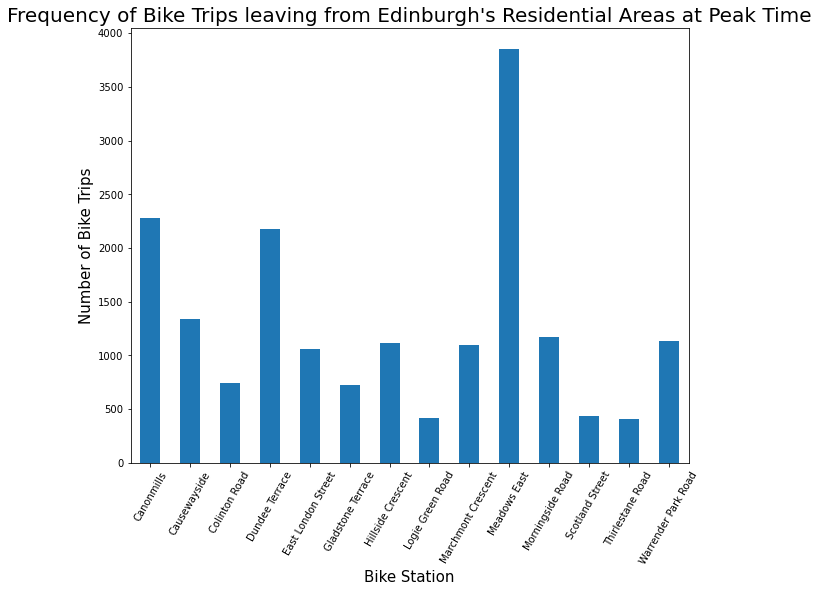

In [44]:
# Group by start_station_name and count how many entries there are
residential_count = peak_res_time.groupby('start_station_name')['start_station_name'].count()

# Change this to a dataframe (the last line creates something called a series)
residential_count = pd.DataFrame(residential_count)

# Rename the count column to something sensible
residential_count.columns = ['number_of_trips']

residential_count.plot(kind="bar", legend=False)
plt.ylabel("Number of Bike Trips", size = 15)
plt.xlabel("Bike Station", size = 15)
plt.title("Frequency of Bike Trips leaving from Edinburgh's Residential Areas at Peak Time", size = 20)
plt.xticks(size=10, rotation = 60)
plt.rcParams['figure.figsize'] = [10, 8]


#### This bar chart tells us the most popular residential bike stations used by commuters at commuting times. 

It is very clear that Meadows East is the most popular commuting bike station, with Canonmills and Dundee Terrace being close joint second. 

Meadows East is one of the bike stations located in the southern residential region of Edinburgh's city centre, being right between Marchmont and Newington. This location is right in the middle of not only many residents of Edinburgh's city centre but also on a main street near many local businesses - it is not surprising that this bike station is so popular as many of the city centre's residents and workers live/work around here.



# 3 Popularity - Looking for Patterns

### We will now look at where all of these residential bike stations are located, along with the corresponding end stations to see if there are any clear patterns or popular areas/workplaces.

In [45]:
# making a geodatafram with the residential station locations and the number of trips from these stations
# extracting the relevant columns for the start station info
res_bike_station_loc = peak_res_time[ ['start_station_name','start_station_longitude','start_station_latitude']]
res_bike_station_loc = res_bike_station_loc.drop_duplicates(subset = "start_station_name")

res_bike_station_loc.reset_index(drop=True, inplace=True)
residential_count.reset_index(drop=True, inplace=True)

res_start_station_summary = pd.concat([res_bike_station_loc, residential_count], axis=1)

# making the geodatafram
res_start_station_gdf = gpd.GeoDataFrame(
    res_start_station_summary, geometry=gpd.points_from_xy(res_start_station_summary["start_station_longitude"], 
                                                          res_start_station_summary["start_station_latitude"]))


In [47]:
# creating a dataframe with the number of trips at each end station from the peak time trips starting in residential
# grouping the peak residential datafram by end station, counting how many there are
res_end_count = peak_res_time.groupby('end_station_name')['end_station_name'].count()

res_end_count = pd.DataFrame(res_end_count)
# Rename the count column to something sensible
res_end_count.columns = ['number_of_trips']

# turning these corresponding end station info into a geodataframe
res_end_station_loc = peak_res_time[ ['end_station_name','end_station_longitude','end_station_latitude']]
res_end_station_loc = res_end_station_loc.drop_duplicates(subset = "end_station_name")

res_end_station_loc.reset_index(drop=True, inplace=True)
res_end_count.reset_index(drop=True, inplace=True)

res_end_station_summary = pd.concat([res_end_station_loc, res_end_count], axis=1)

# making the geodataframe
res_end_station_gdf = gpd.GeoDataFrame(
    res_end_station_summary, geometry=gpd.points_from_xy(res_end_station_summary["end_station_longitude"], 
                                                          res_end_station_summary["end_station_latitude"]))

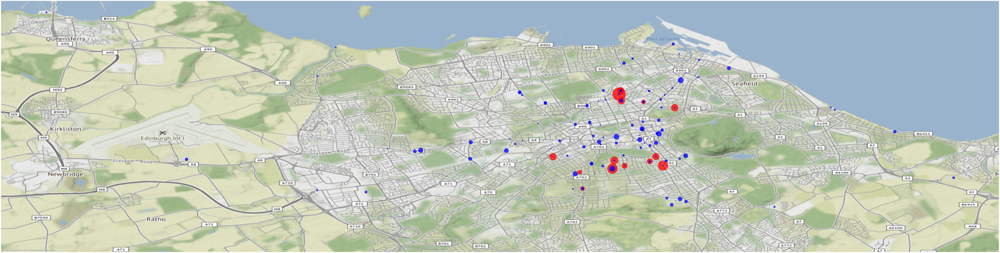

In [48]:
# res_start_station_gdf.crs = {'init':'epsg:4326'}
# res_end_station_gdf.crs = {'init':'epsg:4326'}

# f, ax = plt.subplots(1, figsize=(120, 120))

# # plotting the starting and end stations on the map, mulptiplying number of trips by 2 for visual effect
# res_start_station_gdf.plot(ax=ax, alpha = 0.75, markersize=res_start_station_gdf["number_of_trips"]*2, color="r")
# res_end_station_gdf.plot(ax=ax, alpha = 0.75, markersize=res_end_station_gdf["number_of_trips"]*2, color="b")
# ax.set_axis_off()

# ctx.add_basemap(ax, crs=res_start_station_gdf.crs)

# plt.show()

### The above map has the locations of all the start and end stations of commuters from residential areas during peak time.

#### The red bubbles are the starting stations in the residential areas and the blue are the the end stations. The size of the bubbles represents the popularity of that station.

We can see that the bike stations in the residential areas of south side of the city centre appear to be the most popular - this is in the Marchmont area. The northern residential area of Canonmills also is used frequently (this is the topmost cluster of red bubbles on the map).

It is no surprise that Marchmont and Canonmills are the most popular places for bike use among Edinburgh residents: these bike stations are in the heart of the residential areas. Residents appear to be more inclined to use the stations that are closer to where they live within Marchmont or Canonmills, as opposed to walking to one nearer a big open road, further from where they stay.

- In terms of expanding the Just Eat Cycles business with regards to the residents's cycle habits, a suggestion would be to simply put in place more bike stations in more residential areas. Residents seem to use the bikes that are close to them - so in areas like Merchiston and Murrayfeild to the West, and even in places like Leith to the Northeast there is no doubt that the residents in these areas would make use of bike stations if more were installed. 
    
It is important to note that bike stations do exist in Fountainbridge - the area in between Murrayfield and Merchiston, but again, regarding the habits of commuting residents, it would be beneficial to have more bike stations in the quieter residential areas as residents are more likely to use bikes if the stations are located in the areas further from the busy thoroughfares.

#### There is no clear pattern regarding the end stations.

As seen on the map, the people commuting out of these residential areas are going all over the city. This indicates that people are well aware of the expanse of the Just Eat Cycles and that people have felt the business is good enough to use to commute frequently.

In order to expand the Just Eat Cycles business in this sense, given that there is no clear specific workplace or area that people commute to, the business could reach out to workplaces in the city centre and insentivise use of the bikes. 

As found in the start of this report, people don't tend to travel by bike for longer than around 20 minutes, so the best option would be to find businesses whose employees live locally and to offer them discounted rates on bike usage: either start a "club deal" whereby if your company is taking part, you get discounted bike rides or a yearly subscription discount. 
This could be offered in exchange for advertisements of the Just Eat Cycles within these Edinburgh businesses, or indeed having a new bike station installed right outside the front door of the workplaces.

